# **Use of AI in EUDA**

> How can we use AI to speed up our work?

**Stituation:** we are in 2027. The Latvian Health Authorities have been reporting cases of people dying in a small city in Latvia - Jēkabpils. Forensic reports are not clear and most of the deaths have been reported within an area of high-risk drug use. The Comission and European Authorities are worried and they have urgency in understaning the nature of the situation. EUDA got a request for a threat assessment and we need to reply within three weeks.

What would we do? **Can AI help?**








*   Question & Answer
*   Asking questions to tables
*   Understanding to which topic(s) a text, or a collection of texts belong to
*   Summarizing text
*   Listening, transcribing and translating

# **Loading resources**

In [1]:
%%capture
#@title Loading packages, AI models and data sources
!pip install transformers
!pip install newspaper3k
!pip install -q gwpy
!pip install kenlm
!pip install pyctcdecode

!cp /content/drive/MyDrive/Projects/AI\ Demo\ EUDA/edr.py /content
!cp /content/drive/MyDrive/Projects/AI\ Demo\ EUDA/video_section.mp4 /content
!cp /content/drive/MyDrive/Projects/AI\ Demo\ EUDA/Untitled.wav /content
!cp /content/drive/MyDrive/Projects/AI\ Demo\ EUDA/dummy_table.py /content
!cp /content/drive/MyDrive/Projects/AI\ Demo\ EUDA/dummy_table.py /content
!cp /content/drive/MyDrive/Projects/AI\ Demo\ EUDA/edr_sections.py /content

import pandas as pd
from transformers import pipeline
from edr import edr_text
from dummy_table import table
from newspaper import Article
from edr_sections import drid_edr_section, cocaine_section
import cv2
from matplotlib import pyplot as plt

question = pipeline("question-answering", model = "distilbert-base-cased-distilled-squad")
summarization = pipeline("summarization", model = "sshleifer/distilbart-cnn-12-6")


sum = pipeline("summarization", model = "facebook/bart-large-cnn")
table_question = pipeline("table-question-answering", model = "google/tapas-large-finetuned-wtq")
classifier = pipeline("zero-shot-classification", model="facebook/bart-large-mnli")
transcriber = pipeline("automatic-speech-recognition", model = "jonatasgrosman/wav2vec2-large-xlsr-53-english")
image_classifier = pipeline(model="microsoft/beit-base-patch16-224-pt22k-ft22k")
translator = pipeline("translation_en_to_fr", model = "t5-base")

topics = ['health', 'crime', 'politics', 'sports', 'television', 'diseases']

# **Question & Answer**

> Imagine you are asked to go to Latvia to do a threat assessment. This request came out today and you have to flight to Latvia in 5 days. You need to prepare a small report to share with colleagues in Latvia and you need to look within a corpus of text for data.

What would you do? **Can AI help?**











*   How many people used cocaine in the last year?
*   What is the percentage of people that used cocaine in the last year?
*   Who many countries that conducted surveys since 2020 reported higher estimates?
*   How many countries conducted surveys since 2020?
*   What was the most frequent combination in syringes used by ESCAPE?
*   In which cities cocaine was detected in syringes analysed?
*   How many people entered treatment for crack cocaine use?
*   How many clients entered specialised drug treatment?
*   What was the percentage of cocaine treatment clients among first-time entrants?
*   How many tonnes of cocaine were seized?
*   How many seizures of cocaine were reported?
*   Which countries reported the highest amounts of tonnes of cocaine?

In [4]:
#@title Loading text from EDR section on Cocaine
cocaine = edr_text("https://www.emcdda.europa.eu/publications/european-drug-report/2023/cocaine_en")
print(cocaine)

Cocaine is, after cannabis, the second most commonly used illicit drug in Europe, although prevalence levels and patterns of use differ considerably between countries. On this page, you can find the latest analysis of the drug situation for cocaine in Europe, including prevalence of use, treatment demand, seizures, price and purity, harms and more. This page is part of the European Drug Report 2023 , the EMCDDA's annual overview of the drug situation in Europe. Table of contents/Search Table of contents Search within the book Search within the book Operator Any match Exact term match only Select any filter and click on Search to see results Last update: 16 June 2023

Historically high cocaine seizures highlight threats to health

Cocaine is, after cannabis, the second most commonly used illicit drug in Europe, although prevalence levels and patterns of use differ considerably between countries (see the Prevalence of cocaine use in Europe dashboard, below). Cocaine is usually available 

In [ ]:
#@title How many people used cocaine in the last year?
question(question = "How many people used cocaine in the last year?", context = cocaine)['answer']

'2.3 million 15- to 34'

In [ ]:
#@title What is the percentage of people that used cocaine in the last year?
question(question = "What is the percentage of people that used cocaine in the last year?", context = cocaine)['answer']

'2.3 %'

In [ ]:
#@title How many countries that conducted surveys since 2020 reported higher estimates?
question(question = "How many countries that conducted surveys since 2020 reported higher estimates?", context = cocaine)['answer']

'5'

In [5]:
#@title How many countries conducted surveys since 2020?
question(question = "How many countries conducted surveys since 2020?", context = cocaine)["answer"]

'11'

In [ ]:
#@title What was the most frequent combinaton in syringes used by ESCAPE?
question(question= "What was the most frequent combination in syringes used by ESCAPE?", context = cocaine)["answer"]

'stimulant and an opioid'

In [ ]:
#@title In which cities cocaine was detected in syringes analysed?
question(question = "In which cities cocaine was detected in syringes analysed?", context = cocaine)['answer']

'Athens, Cologne, Dublin and Thessaloniki'

In [6]:
#@title How many people entered treatment for crack cocaine use?
question(question = "How many people entered treatment for crack cocaine use?", context = cocaine)["answer"]

'7 500'

In [7]:
#@title How many clients entered specialised drug treatment?
question(question = "How many clients entered specialised drug treatment?", context = cocaine)['answer']

'25 000'

In [8]:
#@title What was the percentage of cocaine treatment among first-time entrants?
question(question = "What was the percentage of cocaine treatment clients among first-time entrants?", context = cocaine)['answer']

'2 600'

In [9]:
#@title How many tonnes of cocaine were seized?
question(question = "How many tonnes of cocaine were seized?", context = cocaine)['answer']

'303'

In [10]:
#@title How many seizures of cocaine were reported?
question(question = "How many seizures of cocaine were reported?", context = cocaine)['answer']

'8'

In [11]:
#@title Which countries reported the highest amounts of tonnes of cocaine?
question(question = "Which countries reported the highest amounts of tonnes of cocaine?", context = cocaine)["answer"]

'Belgium, the Netherlands and Spain'

# **Asking questions to tables**
> For the threat assessment you will also need to query tables in a database and in excel files. You have identified the tables you need and want to query them. The problem is that you are short in time and you need fast and quick results.

How would you do it? **Can AI help?**



*   Which country has the highest last month prevalence?
*   What is the last month prevalence in Romania?
*   How many deaths were reported in Belgium?
*   What is the country with the highest deaths?

In [ ]:
#@title This is a table with dummy data
pd.DataFrame.from_dict(table)

,Country,Last year prevalence,Last month prevalence,Lifetime prevalence,Deaths,Cannabis price,Cannabis purity
0,Austria,16.2,10.5,22.5,24,5€,78%
1,Belgium,18.3,14.7,23.8,234,12€,83%
2,Bulgaria,7.2,11.2,32.5,14,7€,65%
3,Czechia,2.5,12.5,4.5,267,8€,92%
4,Romania,9.1,16.9,6.5,48,25€,82%


In [ ]:
#@title Which country has the highest last month prevalence?
table_question(query = "Which country has the highest last month prevalence?", table = table)["answer"]

'Romania'

In [ ]:
#@title What is the last month prevalence in Romania?
table_question(query = "What is the last month prevalence in Romania?", table = table)["answer"]

'SUM > 16.9'

In [12]:
#@title How many deaths were reported in Belgium?
table_question(query = "How many death were reported in Belgium?", table = table)["answer"]

'SUM > 234'

In [13]:
#@title What is the country with the highest deaths?
table_question(query = "What is the country with the highest deaths?", table = table)["answer"]

'Czechia'

# **Understanding to which topic(s) a text, or a collection of texts belong to**

> For the threat assessment you realise that we don't have enough data and the alternative is to make a literature review. You go to pubmed and you search for the topic of the threat assessment. Pubmed returns 1 500 papers on the topic. You might be facing a time problem. You only have 5 days and 1 500 papers to read.

How would you do it? **Can AI help?**






Maybe you can start by splitting your pubmed search into topics of interest.

Lets start with the following topics:


*   Health
*   Crime
*   Politics
*   Sports
*   Television
*   Diseases

To ilustrate we will use a paragraph from the DRID section of this years's EDR:


> People who inject drugs are at risk of contracting infections such as viral hepatitis B and C (HBV and HCV, respectively) and the human immunodeficiency virus (HIV) through the sharing of drug use paraphernalia. These infections can cause chronic diseases that may result in severe health-related harms, including death. While long-term trends in new HIV infections associated with drug injection have been falling in Europe, the risk of HIV transmission among people who inject drugs remains higher than for the general population, and transmission rates attributable to injecting are also still elevated in some countries.

In [ ]:
#@title Classifying the DRID section. To which categories do you think the text will belong to?
classification = classifier(drid_edr_section, topics, multi_label = True)
print(f"""{classification['labels']} \n {[round(n, 3) for n in classification['scores']]}""" )

['health', 'diseases', 'crime', 'television', 'politics', 'sports'] 
 [0.953, 0.935, 0.058, 0.031, 0.02, 0.004]


And a paragraph from the Cocaine section:

> Cocaine is produced from the coca plant, grown in South America.
It enters Europe through various channels, but the trafficking of large volumes of cocaine through Europe’s seaports in intermodal commercial shipping containers is considered a significant factor in the high availability of this drug observed today.
Cocaine trafficking by this route is also associated with rising leinfvels of drug-related crime, including the corruption of staff along supply chains, intimidation and violence.
More generally, there are concerns that in some EU countries competition within the cocaine market, both at the wholesale and retail level, is now an important driver of drug-related crime including gang-related violence and homicides.

In [ ]:
#@title  Which topics will be assigned to the Cocaine section?
classification = classifier(cocaine_section, topics, multi_label = True)
print(f"""{classification['labels']} \n {[round(n, 3) for n in classification['scores']]}""" )

['crime', 'health', 'diseases', 'politics', 'television', 'sports'] 
 [0.973, 0.317, 0.092, 0.077, 0.051, 0.021]


# **Summarizing text**


> You have now filtered the pubmed search for the topic of interest, but the problem is that you still have 750 papers to read. You have 5 days before flying to Latvia and you need to prepare the threat assessment, you need to contact the Focal Point, you have three EUDA meetings and the literature review has to be done before you flight.

What would you do? **Can AI help?**

In [ ]:
#@title Lets pull back the Cocaine section of this year's EDR and make a summary of it. How it will look?
summarization(cocaine[0:5500])[0]["summary_text"]

" European Drug Report 2023 is the EMCDDA's annual overview of the drug situation in Europe . Cocaine is, after cannabis, the second most commonly used illicit drug in Europe, although prevalence levels and patterns of use differ considerably between countries . A record 303 tonnes of cocaine was seized by EU Member States in 2021 . Belgium, the Netherlands and Spain are the countries reporting the highest volumes of seizures ."

# **Listening, transcribing and translating**

> You finally arrived in Latvia. You are now heading to a small city and you are ready to meet with field workers to enquire about the subject of the threat assessment. On the arrival you notice that people you are meeting do not understand or speak english, you don't have a translator and there's nobody to help.

What would you do? **Can AI help?**






In [ ]:
#@title A sample of Alexis presention of this year's EDR
from IPython.display import HTML
from base64 import b64encode
mp4 = open('video_section.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=800 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [ ]:
#@title Listening and transcribing
speech_to_text = transcriber("Untitled.wav")
speech_to_text["text"]

'if we want to characterize the drug situation there are three main trends first his drugs are everywhere everything can be used as a drug today and everyone can be confronted either directly or indirectly to any addictive behaviour but what is also new to the consequences of drug related violence'

In [ ]:
#@title Translating (to French)
translation = translator(speech_to_text["text"])
translation[0]["translation_text"]

"si nous voulons caractériser la situation de la drogue il y a trois principales tendances d'abord ses drogues sont partout tout peut être utilisé comme drogue aujourd'hui et chacun peut être confronté directement ou indirectement à tout comportement de toxicomanie mais ce qui est également nouveau aux conséquences de la violence liée à la drogue"

# **Lets try with other (random) examples?**

In [ ]:
from newspaper import Article
url = "https://www.theguardian.com/music/2023/aug/07/tory-lanez-shooting-megan-thee-stallion-sentenced"
article = Article(url)
article.download()
article.parse()
article = article.text
print(article)

Musician Tory Lanez is set to be sentenced on Monday for shooting fellow artist Megan Thee Stallion in 2020.

Lanez, whose legal name is Daystar Peterson, was found guilty in December 2022 of three felonies in the shooting which left Megan Thee Stallion wounded with bullet fragments in her feet.

Prosecutors have called for Lanez to be sentenced to 13 years in prison for the offense, and what they have described as a subsequent “campaign of misinformation” waged through hip-hop blogs and music meant to decimate Megan Thee Stallion’s credibility. Lanez’s defense team has called for probation and a residential drug treatment program that would help the artist deal with alcoholism, which they say he developed to cope with childhood trauma.

The sentencing will mark the end of a polarizing three-year saga that played out in court, the artists’ social media and on hip-hop gossip blogs.

Prosecutors said it began on 12 July 2020, with a small pool party at Kylie Jenner’s mansion in the Holly

In [ ]:
summary_text = summarization(article)[0]["summary_text"]
summary_text

' Musician Tory Lanez is set to be sentenced on Monday for shooting fellow artist Megan Thee Stallion in 2020 . Lanez was found guilty in December 2022 of three felonies in the shooting which left her with bullet fragments in her feet . The sentencing will mark the end of a polarizing three-year saga that played out in court and on hip-hop gossip blogs .'

In [ ]:
translation = translator(summary_text)
translation[0]["translation_text"]

"L'artiste Tory Lanez sera condamné lundi pour avoir tué sa compagnon Megan Thee Stallion en 2020 . Lanez a été reconnue coupable en décembre 2022 de trois infractions pénales dans l'attentat qui lui a laissé des fragments de balle dans ses pieds ."

In [ ]:
question(question = "When Tory Lanez killed was sentenced?", context = article)['answer']

'Megan Thee Stallion in 2020'

In [ ]:
classification = classifier(article, topics, multi_label = True)
print(f"""{classification['labels']} \n
 {[round(n, 2) for n in classification['scores']]}""" )

['politics', 'sports', 'television', 'crime', 'health', 'diseases'] 

 [0.39, 0.35, 0.33, 0.26, 0.25, 0.19]


--2023-08-07 10:44:31--  https://i.guim.co.uk/img/media/a4123e04096dcbed4b222b24b33f0b8ed5a377aa/0_192_4671_2803/master/4671.jpg?width=620&dpr=2&s=none
Resolving i.guim.co.uk (i.guim.co.uk)... 151.101.1.111, 151.101.65.111, 151.101.129.111, ...
Connecting to i.guim.co.uk (i.guim.co.uk)|151.101.1.111|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 47046 (46K) [image/jpeg]
Saving to: ‘4671.jpg?width=620&dpr=2&s=none.1’

4671.jpg?width=620& 100%[===================>]  45.94K  --.-KB/s    in 0.004s  

2023-08-07 10:44:31 (11.9 MB/s) - ‘4671.jpg?width=620&dpr=2&s=none.1’ saved [47046/47046]



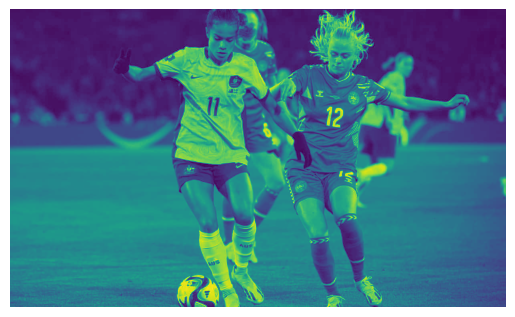

In [ ]:
image_url = "https://i.guim.co.uk/img/media/a4123e04096dcbed4b222b24b33f0b8ed5a377aa/0_192_4671_2803/master/4671.jpg?width=620&dpr=2&s=none"
!wget "https://i.guim.co.uk/img/media/a4123e04096dcbed4b222b24b33f0b8ed5a377aa/0_192_4671_2803/master/4671.jpg?width=620&dpr=2&s=none"

img_color = cv2.imread('4671.jpg?width=620&dpr=2&s=none',0)
plt.imshow(img_color)
plt.axis("off")
plt.show()

In [ ]:
img =image_classifier(image_url)
img[0]['label']

'professional_football'

In [ ]:
img